---

<h1 style="color:#012eba">Introduction to Image Processing with Python</h1>
<h1 style="color:#012eba">Episode 3: Spatial Filters and Morphological Operations</h1>

---

*DASCI 261 - Introduction to Image Processing*

*Prepared by Erika G. Lacson*

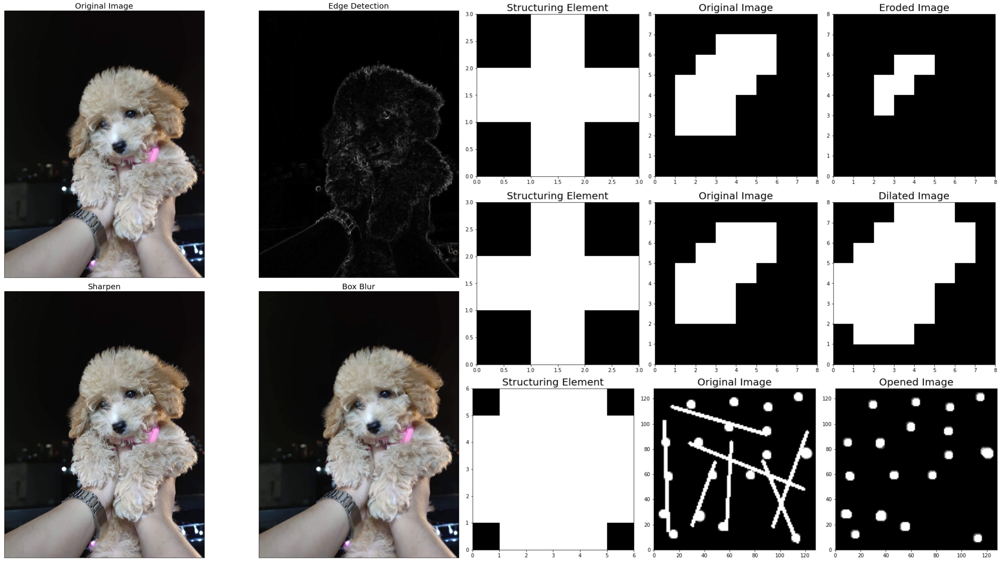

Photos by Author

---
<h2 style="color:#ff0090">Introduction</h2>

Hello again, fellow image processing enthusiasts! 🌟 In the previous episodes, we tackled the basics and discovered the magic of image enhancements. This time around, we’re diving deeper into spatial filters and morphological operations. Grab your digital snorkeling gear because we’re about to explore these powerful tools that can truly transform the way we interact with images. 💪🖼️

So, are you pumped? Let’s jump right in! 🚀

---
<h2 style="color:#ff0090">A. Spatial Filters: Introduction and Application</h2>


When it comes to image manipulation, spatial filters are the tools we need. 💫 These filters have the remarkable ability to modify pixel values based on the values of neighboring pixels, enabling us to perform various image processing tasks such as noise reduction, edge detection, and smoothing.

To kick things off, let’s import the necessary libraries and set the stage for our spatial filtering activity:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from fractions import Fraction
from skimage.io import imread, imshow

# For Spatial Filters
from scipy.signal import convolve2d
from skimage.color import rgb2gray, gray2rgb

# For Morphological Operations
from skimage.morphology import erosion, dilation, opening, closing
from skimage.morphology import disk

Next, we’ll apply various simple spatial filters to an image. These filters alter each pixel value with the average value of the pixels around it, making way for mesmerizing effects and enhancements.

Check out the main filters we’ll be playing with today: 🎨✨

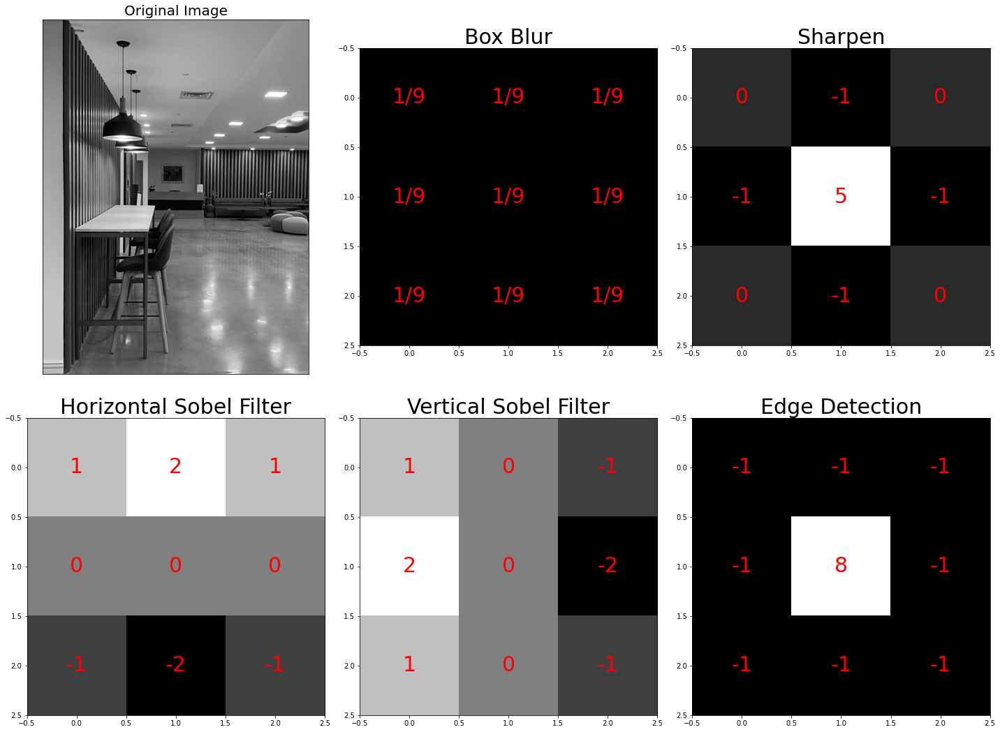

In [2]:
def display_filters(image_path):
    """Defines and displays various image filters/kernels.
    These include Horizontal Sobel Filter, Vertical Sobel Filter,
    Edge Detection, Sharpen, and Box Blur. 
    """
    # Define Filters
    # Horizontal Sobel Filter
    kernel_hsf = np.array([[1, 2, 1],
                           [0, 0, 0],
                           [-1, -2, -1]])

    # Vertical Sobel Filter
    kernel_vsf = np.array([[1, 0, -1],
                           [2, 0, -2],
                           [1, 0, -1]])

    # Edge Detection
    kernel_edge = np.array([[-1, -1, -1],
                            [-1, 8, -1],
                            [-1, -1, -1]])


    # Sharpen
    kernel_sharpen = np.array([[0, -1, 0],
                               [-1, 5, -1],
                               [0, -1, 0]])

    # Box Blur
    kernel_bblur = (1 / 9.0) * np.array([[1., 1., 1.],
                                         [1., 1., 1.],
                                         [1., 1., 1.]])

    # Define the kernels
    kernels = {
        'Box Blur': kernel_bblur,
        'Sharpen': kernel_sharpen,
        'Horizontal Sobel Filter': kernel_hsf,
        'Vertical Sobel Filter': kernel_vsf,
        'Edge Detection': kernel_edge,
    }
    
    # Read the image
    image = imread(image_path)[:,:,:3]    

    # Create a figure with subplots for each kernel
    fig, ax = plt.subplots(2, 3, figsize=(20, 15))

    ax[0, 0].imshow(rgb2gray(image[:,:,:3]), cmap='gray')
    ax[0, 0].set_title('Original Image', fontsize=20)
    ax[0, 0].set_xticks([])
    ax[0, 0].set_yticks([])

    # Loop over the keys and values in the kernels dictionary
    for i, (name, kernel) in enumerate(kernels.items(), 1):
        # Determine the subplot index
        row = i // 3
        col = i % 3

        # Plot the kernel on the appropriate subplot
        ax[row, col].imshow(kernel, cmap='gray')
        ax[row, col].set_title(name, fontsize=30)

        # Loop over the cells in the kernel
        for (j, k), val in np.ndenumerate(kernel):
            # Add a text annotation at (j, k) with the value of the cell
            # If the value is less than 1, represent it as a fraction
            if val < 1:
                ax[row, col].text(k, 
                                  j, 
                                  str(Fraction(val).limit_denominator()), 
                                  ha='center', 
                                  va='center', 
                                  color='red',
                                  fontsize=30)
            else:
                ax[row, col].text(k, 
                                  j, 
                                  str(val), 
                                  ha='center', 
                                  va='center', 
                                  color='red',
                                  fontsize=30)

    # Show the plot
    plt.tight_layout()
    plt.show()
display_filters('dorm_lobby.png')    

Original and Spatial Filters. Photos by Author

By using the `display_filters()` function, we can get a visual representation of the different image filters or kernels. Each filter symbolizes a unique pattern or effect that can be applied to an image. You'll come across filters like the `Horizontal Sobel Filter`, `Vertical Sobel Filter`, `Edge Detection`, `Sharpen`, and `Box Blur`, to name a few. And guess what? These are just the tip of the iceberg. There are even more amazing filters waiting for you at this Wikipedia link: https://en.wikipedia.org/wiki/Kernel_(image_processing) 🔍🔮

But we're not stopping there! Let's take things a notch higher and apply these filters to real images. Witness the magic unfold as we use the `apply_selected_kernels()` function to give an image a total makeover: 🖼️✨

In [3]:
def apply_selected_kernels(image_path, selected_kernels, plot_cols=3):
    """Applies selected kernels or filters to an image.
    The image is read from the provided image_path, and the specified kernels 
    are applied to it. The results are then displayed in a subplot alongside 
    the original image.

    Args:
        image_path (str): The path to the image to which the filters 
            should be applied.
        selected_kernels (list): A list of kernels to apply to the image.
        plot_cols (int, optional): The number of columns in the subplot. 
            Default is 3.

    Raises:
        ValueError: If a selected kernel is not defined.
    """
    # Define the filters
    kernel_hsf = np.array([[1, 2, 1],
                           [0, 0, 0],
                           [-1, -2, -1]])  # Horizontal Sobel Filter

    kernel_vsf = np.array([[1, 0, -1],
                           [2, 0, -2],
                           [1, 0, -1]])  # Vertical Sobel Filter

    kernel_edge = np.array([[-1, -1, -1],
                            [-1, 8, -1],
                            [-1, -1, -1]])  # Edge Detection

    kernel_sharpen = np.array([[0, -1, 0],
                               [-1, 5, -1],
                               [0, -1, 0]])  # Sharpen

    kernel_bblur = (1 / 9.0) * np.array([[1., 1., 1.],
                                         [1., 1., 1.],
                                         [1., 1., 1.]])  # Box Blur

    # Define the kernels
    all_kernels = {
        'Box Blur': kernel_bblur,
        'Sharpen': kernel_sharpen,
        'Horizontal Sobel Filter': kernel_hsf,
        'Vertical Sobel Filter': kernel_vsf,
        'Edge Detection': kernel_edge,
    }

    # Check if the selected kernels are defined, if not raise an exception
    for k in selected_kernels:
        if k not in all_kernels:
            raise ValueError(f"Kernel '{k}' not defined.")

    # Read the image
    image = imread(image_path)[:,:,:3]

    # Apply selected kernels to each color channel of the image and 
    # save the resulting converted RGB images
    conv_rgb_images = {}
    for kernel_name in selected_kernels:
        kernel = all_kernels[kernel_name]
        transformed_channels = []
        for i in range(3):
            conv_image = convolve2d(image[:, :, i], kernel, 'valid')
            transformed_channels.append(abs(conv_image))
        
        conv_rgb_image = np.dstack(transformed_channels)
        conv_rgb_image = np.clip(conv_rgb_image, 0, 255).astype(np.uint8)
        conv_rgb_images[kernel_name] = conv_rgb_image

    # Display the original image along with the combined results of all 
    # the kernels in a subplot
    fig, ax = plt.subplots(2, plot_cols, figsize=(20, 20))

    ax[0, 0].imshow(image)
    ax[0, 0].set_title('Original Image', fontsize=20)
    ax[0, 0].set_xticks([])
    ax[0, 0].set_yticks([])

    for i, (kernel_name, conv_rgb_image) in enumerate(conv_rgb_images.items(), 1):
        row, col = divmod(i, plot_cols)
        ax[row, col].imshow(conv_rgb_image)
        ax[row, col].set_title(kernel_name, fontsize=20)
        ax[row, col].set_xticks([])
        ax[row, col].set_yticks([])
    plt.tight_layout()
    plt.show()

Thanks to this function, we can apply chosen filters to an image, leading to intriguing visual results. Let's take an image of a dorm lobby with distinct horizontal and vertical lines to visualize the effects of `Edge Detection`, `Horizontal Sobel Filter`, and `Vertical Sobel Filter`:

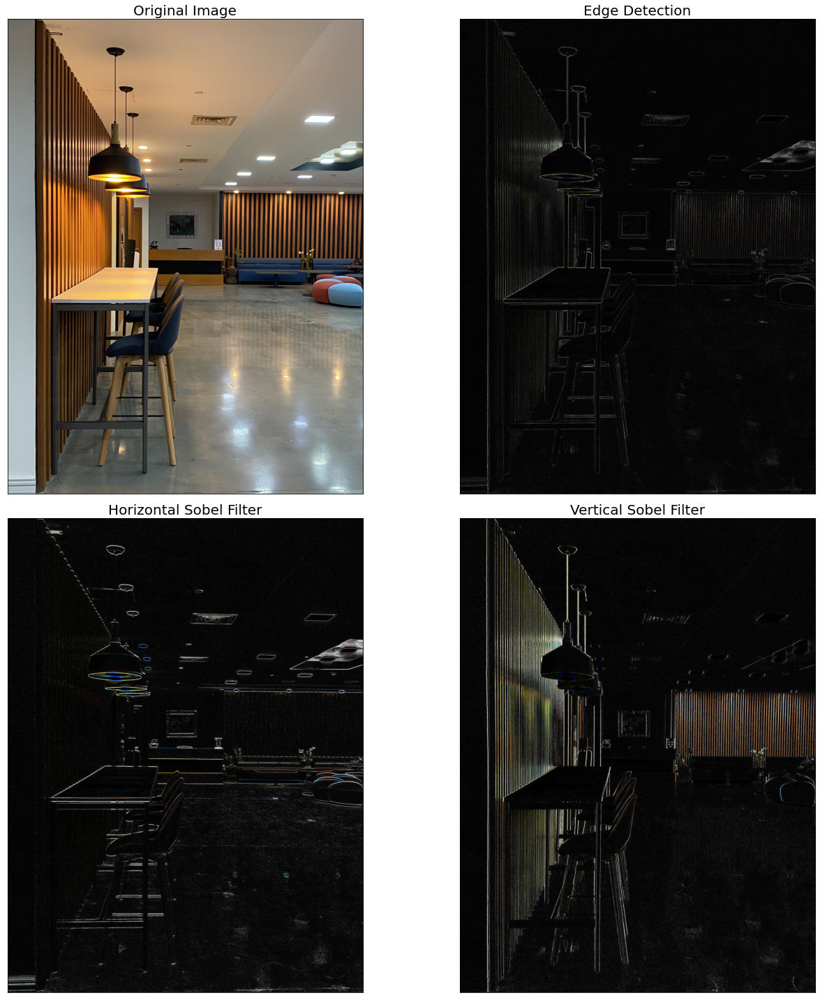

In [4]:
# Visualize Edge Detection and Sobel Filters
apply_selected_kernels('dorm_lobby.png', 
                       ['Edge Detection',
                        'Horizontal Sobel Filter', 
                        'Vertical Sobel Filter'], 
                       plot_cols=2)

Edge detection and Sobel Filters applied on the original image. Photos by Author.

And for the effects of `Edge Detection`, `Sharpen` and `Box Blur`, let's borrow a photo of my good girl, Chloe:

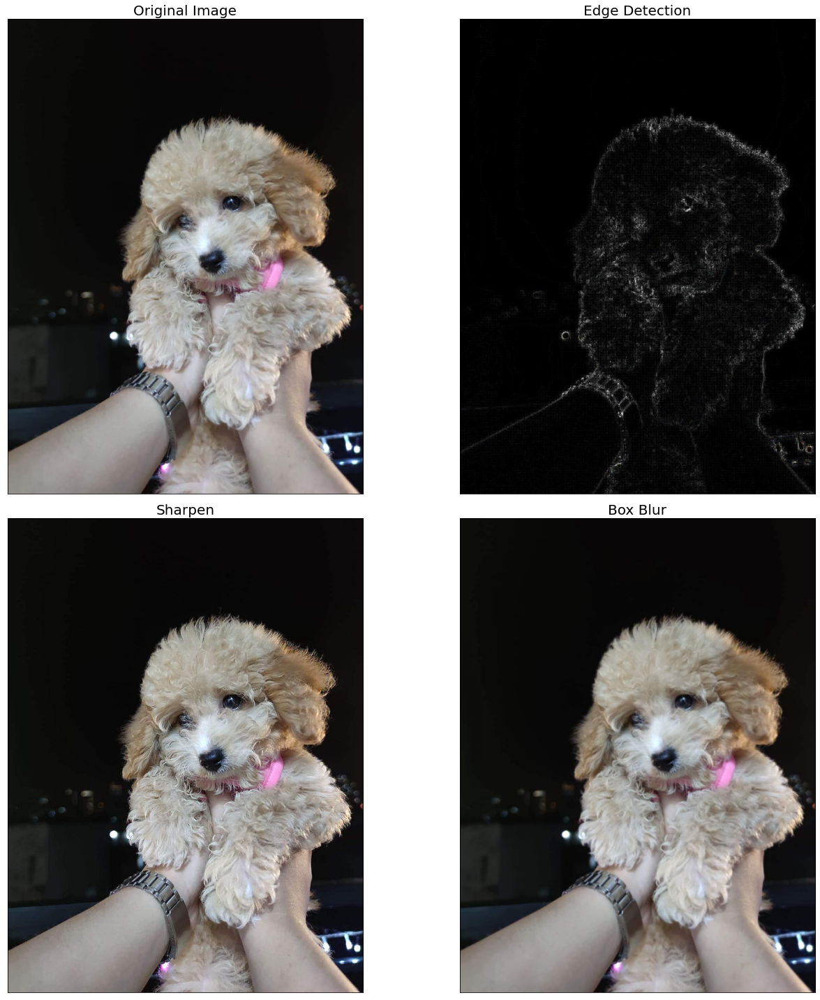

In [5]:
apply_selected_kernels('dog.png', 
                       ['Edge Detection',
                        'Sharpen', 
                        'Box Blur'], 
                       plot_cols=2)

Edge detection, Sharpen, and Box Blur applied on the original image. Photos by Author.

Brace yourselves, because things are heating up! Let's dive deeper into the filters we've just applied: 🤩💬

- `Edge Detection (kernel_edge)`: This is a general edge detection filter, sometimes called a Laplacian filter or a Laplacian of Gaussian filter. This term commonly refers to a range of methods for identifying points in a digital image where the image brightness changes sharply or has discontinuities. It responds to edges of all orientations equally. The difference between this and the Sobel filters is that it doesn't differentiate between edge orientations.

- The `Sobel filter` is used for edge detection, specifically for detecting edges of a particular orientation. The Sobel operator uses two 3x3 kernels which are convolved with the original image to calculate approximations of the derivatives – one for horizontal changes (edges running vertically), and one for vertical changes (edges running horizontally):

    - `Horizontal Sobel Filter (kernel_hsf)`: This is designed to respond maximally to edges running vertically and minimally to edges running horizontally. This is why you may notice that the resulting image highlighted horizontal lines.

    - `Vertical Sobel Filter (kernel_vsf)`: This is the other orientation of the Sobel filter. It's designed to respond maximally to edges running horizontally and minimally to edges running vertically. This is why you may notice that the resulting image highlighted vertical lines.

- `Sharpen (kernel_sharpen)`: This filter is used to enhance the "sharpness" of an image. It works by enhancing the contrast of pixels next to each other, which makes the edges appear more distinct and crisp.

- `Box Blur (kernel_bblur)`: This filter is used to blur an image. It works by averaging the pixel values in the neighborhood around each pixel, which has the effect of reducing the sharpness of edges and blending the colors of nearby pixels.

OOn another note, edge detection filter and the horizontal and vertical Sobel filters can sometimes produce similar-looking results. This is because they are all designed to respond to changes in intensity, which is what an edge is. However, the Sobel filters are sensitive to the orientation of the edge, whereas the edge detection filter is not. So, for example, as evident in the sample image above, if you have an image with a lot of vertical lines, the vertical Sobel filter might produce a strong response, the horizontal Sobel filter might produce a weak response, and the edge detection filter will produce a moderate response.

And voila! These filters offer us immense power to shape and transform images, bringing out their hidden details and enhancing their visual impact. By understanding the characteristics and applications of each filter, we can unleash our creativity and explore endless possibilities in image processing. Isn’t that cool? 😎

---
<h2 style="color:#ff0090">B. Morphological Operations: Erosion, Dilation, Opening, and Closing</h2>


Now, let’s delve into morphological operations. These non-linear image processing techniques allow us to manipulate the shape and structure of objects within an image. In this section, we’ll walk through four fundamental morphological operations: erosion, dilation, opening, and closing.


---
<h3 style="color:#9e02bb">B1. Erosion</h3>


Erosion is a morphological operation that delicately shrinks the objects within an image by removing pixels from their boundaries. It achieves this by considering the neighborhood of each pixel and setting its value to the minimum value among all the pixels in that neighborhood. In a binary image, if any of the neighboring pixels have a value of 0, the output pixel is set to 0 as well.

Time to get our hands dirty and use our `apply_erosion` function:

In [6]:
def apply_erosion(image, selem):
    # Perform erosion on the given image using the structuring element, selem
    eroded_image = erosion(image, selem)

    # Display the original and eroded images
    fig, axes = plt.subplots(1, 3, figsize=(15, 10))
    ax = axes.ravel()
    
    ax[0].imshow(selem, cmap='gray', 
                 extent=[0, selem.shape[1], 0, selem.shape[0]])
    ax[0].set_title('Structuring Element', fontsize=20)

    ax[1].imshow(image, cmap='gray', 
                 extent=[0, image.shape[1], 0, image.shape[0]])
    ax[1].set_title('Original Image', fontsize=20)

    ax[2].imshow(eroded_image, cmap='gray', 
                 extent=[0, image.shape[1], 0, image.shape[0]])
    ax[2].set_title('Eroded Image', fontsize=20)

    plt.tight_layout()
    plt.show()

Let's use the following original image:

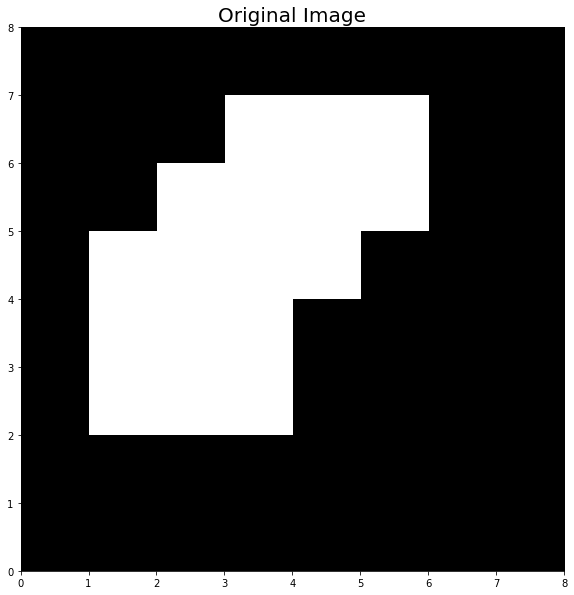

In [7]:
# Define the image
original_image = np.array([[0, 0, 0, 0, 0, 0, 0, 0],
                           [0, 0, 0, 1, 1, 1, 0, 0],
                           [0, 0, 1, 1, 1, 1, 0, 0],
                           [0, 1, 1, 1, 1, 0, 0, 0],
                           [0, 1, 1, 1, 0, 0, 0, 0],
                           [0, 1, 1, 1, 0, 0, 0, 0],
                           [0, 0, 0, 0, 0, 0, 0, 0],
                           [0, 0, 0, 0, 0, 0, 0, 0]])

plt.figure(figsize=(10,10))
plt.imshow(original_image, cmap='gray', extent=[0, 8, 0, 8])
plt.title('Original Image', fontsize=20);

Next, is to define the structuring element (selem). For this example, let's use cross as our selem:

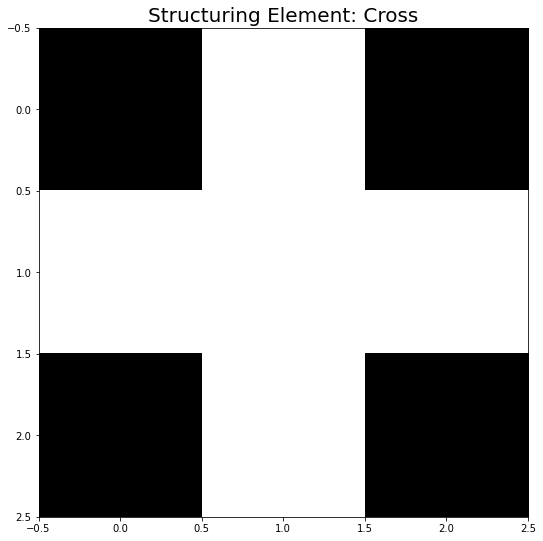

In [9]:
# Define the structuring element
selem_cross = np.array([[0,1,0],
                        [1,1,1],
                        [0,1,0]])
plt.figure(figsize=(9,9))
plt.imshow(selem_cross, cmap='gray')
plt.title('Structuring Element: Cross', fontsize=20);

Cross-shaped Structuring Element. Photo by Author.

Then use the `apply_erosion` function to the original image:

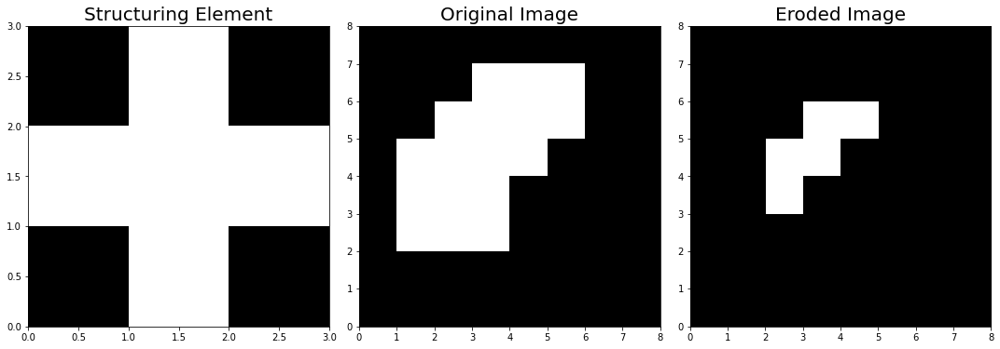

In [14]:
# Apply erosion on the original image with cross structuring element
apply_erosion(original_image, selem_cross)

Erosion applied on original image with cross structuring element. Photos by Author.

Notice the transformation in the original image, it shrank, right?

To further understand how it worked under the hood, take a look at the following gif:

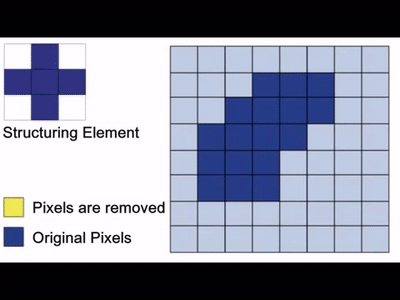

GIF by xavier200090790 on makeagif

The primary objective of erosion is to remove floating pixels and thin lines, leading to the preservation of only substantial objects. After we apply erosion, the remaining lines appear thinner, and the shapes within the image look smaller. Erosion is usually the hero for tasks like object segmentation and boundary extraction, where it eliminates noise and fine details from an image.

Do note that the choice of the neighborhood size or the structuring element used in erosion can significantly impact the results. The choice of different structuring elements, such as squares, disks, or custom shapes, can be employed to achieve specific erosion effects based on the desired outcome. For instance, if I use a square as my structuring element, the eroded image will look something like this:

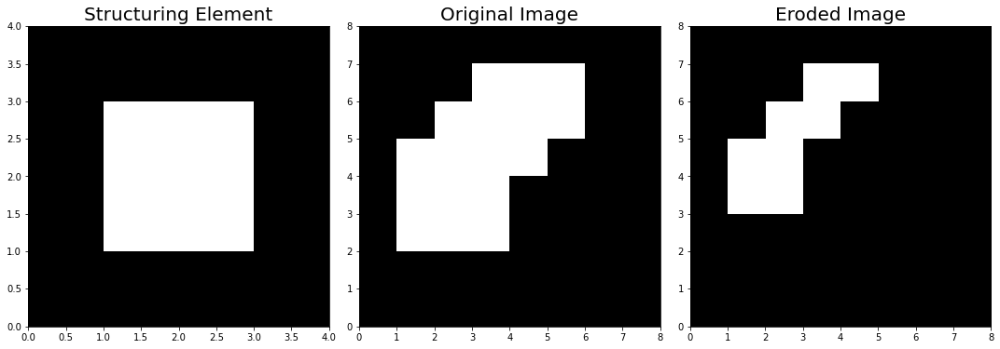

In [16]:
# Define the structuring element 
selem_square = np.array([[0,0,0,0],
                         [0,1,1,0],
                         [0,1,1,0],
                         [0,0,0,0]])

# Apply erosion on the original image with square structuring element
apply_erosion(original_image, selem_square)

Erosion applied on original image with square structuring element. Photos by Author.

---
<h3 style="color:#9e02bb">B2. Dilation</h3>


On the flip side, dilation is the opposite of erosion. It’s another vital morphological operation used in image processing that broadens the objects within an image by adding pixels to their boundaries. Dilation operates by considering the neighborhood of each pixel but assigns its value to the maximum value among all the pixels in that neighborhood. In a binary image, if any of the neighboring pixels have a value of 1, the output pixel is set to 1 as well.

This operation fills small gaps and holes within objects, making them more robust and complete. Time to apply dilation and see the difference:

In [17]:
def apply_dilation(image, selem):
    # Perform dilation on the given image using the structuring element, selem
    dilated_image = dilation(image, selem)

    # Display the original and dilated images
    fig, axes = plt.subplots(1, 3, figsize=(15, 10))
    ax = axes.ravel()
    
    ax[0].imshow(selem, cmap='gray', 
                 extent=[0, selem.shape[1], 0, selem.shape[0]])
    ax[0].set_title('Structuring Element', fontsize=20)

    ax[1].imshow(image, cmap='gray', 
                 extent=[0, image.shape[1], 0, image.shape[0]])
    ax[1].set_title('Original Image', fontsize=20)

    ax[2].imshow(dilated_image, cmap='gray', 
                 extent=[0, image.shape[1], 0, image.shape[0]])
    ax[2].set_title('Dilated Image', fontsize=20)

    plt.tight_layout()
    plt.show()

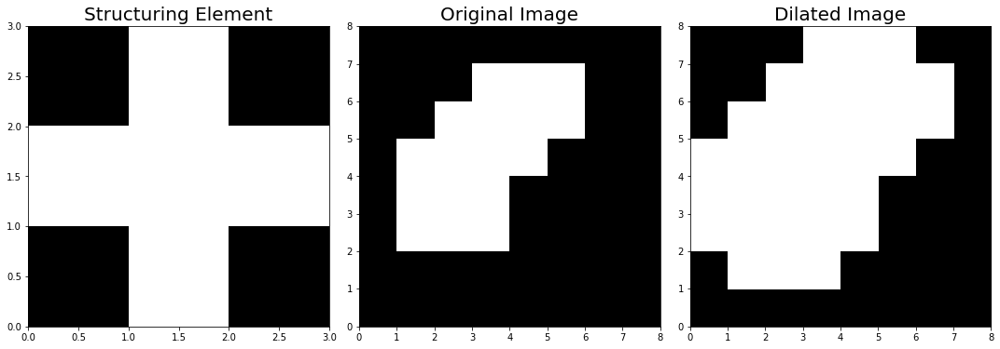

In [18]:
# Apply dilation on the original image with cross structuring element
apply_dilation(original_image, selem_cross)

Dilation applied on original image with cross structuring element. Photos by Author.

Look how the image became thicker.

To further visualize how dilation works, take a look at the gif below:

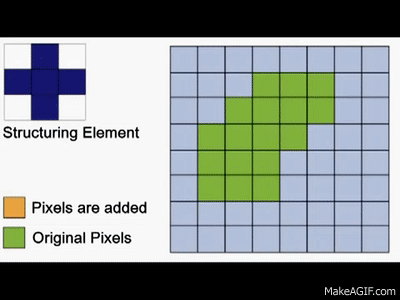

GIF by xavier200090790 on makeagif

The primary purpose of dilation is to make objects more visible and fill in small holes within objects. When dilation is applied, lines appear thicker, and filled shapes appear larger. It helps in enhancing the structural features of an image and making objects stand out. It is usually used to expand objects, connect broken segments, and fill in gaps or holes within the objects.

Just like erosion, it’s important to remember that the size and shape of the neighborhood or the structuring element used in dilation can significantly impact the results. Choosing an appropriate structuring element allows us to control the extent of dilation and tailor it to the specific characteristics of the objects within the image. Let’s use the square selem again on the image:

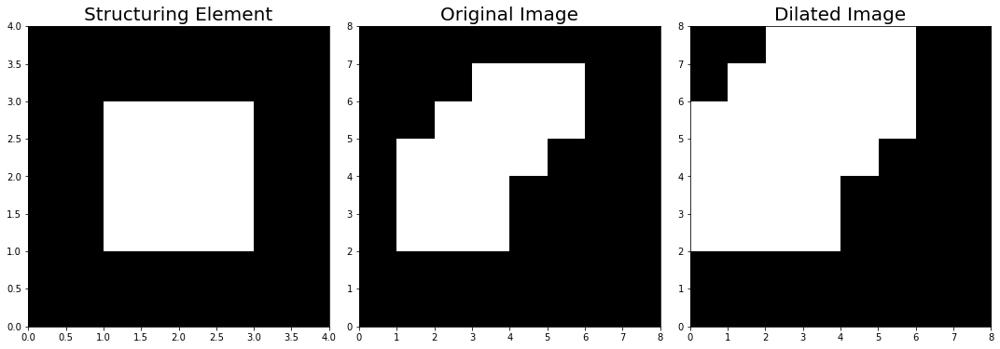

In [19]:
# Apply dilation on the original image with square structuring element
apply_dilation(original_image, selem_square)

Dilation applied on original image with square structuring element. Photos by Author.


---
<h3 style="color:#9e02bb">B3. Opening</h3>


Opening, the dynamic duo of `erosion followed by dilation`, involves applying erosion to an image and then dilating the eroded image using the same structuring element for both operations. It is particularly useful for removing small objects and thin lines from an image (such as image denoising and extracting features) while preserving the shape and size of larger objects. By performing `erosion` first, small-scale noise, fine details, and thin structures are effectively eliminated. Subsequently, `dilation` helps in regaining the shape and size of larger objects, ensuring they remain intact.

To illustrate opening, let's use the `art1.png` and try to retain only the circles:

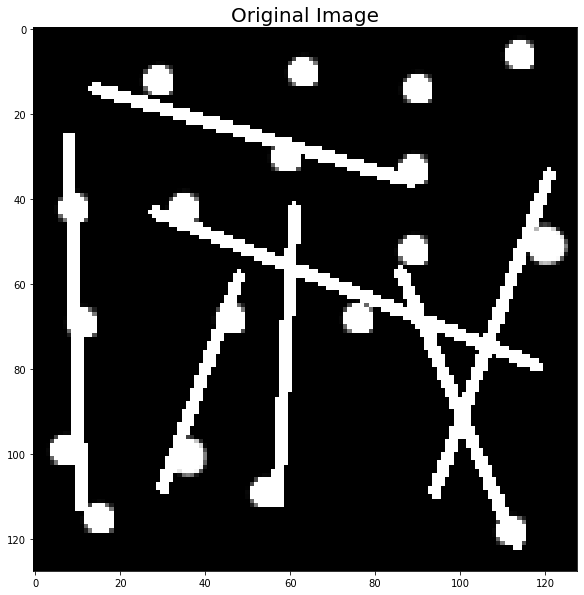

In [11]:
# Display the original image
original_image = rgb2gray(imread('art1.PNG'))
plt.figure(figsize=(10,10))
plt.imshow(original_image, cmap='gray')
plt.title('Original Image', fontsize=20);

Original Image. Photo by Borja, B.

To remove the lines and retain only the circles, let's create a big dot as our structuring element:

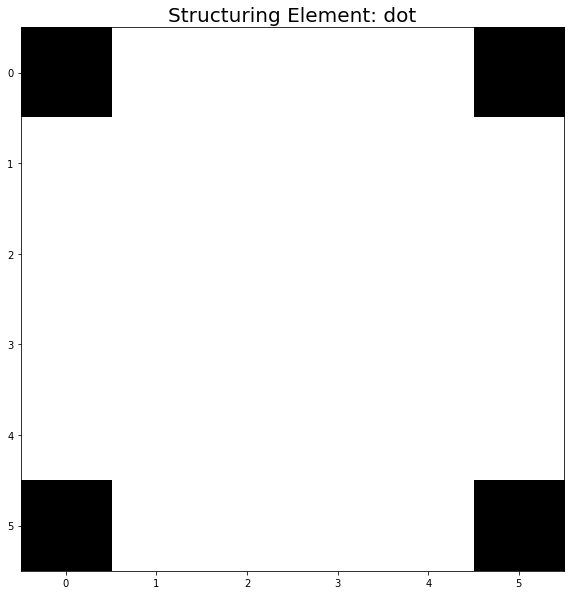

In [13]:
# Define the structuring element
selem_dot = np.array([[0, 1, 1, 1, 1, 0],
                      [1, 1, 1, 1, 1, 1], 
                      [1, 1, 1, 1, 1, 1],
                      [1, 1, 1, 1, 1, 1], 
                      [1, 1, 1, 1, 1, 1],
                      [0, 1, 1, 1, 1, 0]])

plt.figure(figsize=(10,10))
plt.imshow(selem_dot, cmap='gray')
plt.title('Structuring Element: dot', fontsize=20)
plt.show()

Dot Structuring Element. Photo by Author.

Use `apply_opening` function to our original image with selem_dot:

In [23]:
def apply_opening(image, selem):
    # Perform opening on the given image using the structuring element, selem
    opened_image = opening(image, selem)

    # Display the original and opened images
    fig, axes = plt.subplots(1, 3, figsize=(15, 10))
    ax = axes.ravel()
    
    ax[0].imshow(selem, cmap='gray', 
                 extent=[0, selem.shape[1], 0, selem.shape[0]])
    ax[0].set_title('Structuring Element', fontsize=20)

    ax[1].imshow(image, cmap='gray', 
                 extent=[0, image.shape[1], 0, image.shape[0]])
    ax[1].set_title('Original Image', fontsize=20)

    ax[2].imshow(opened_image, cmap='gray', 
                 extent=[0, image.shape[1], 0, image.shape[0]])
    ax[2].set_title('Opened Image', fontsize=20)

    plt.tight_layout()
    plt.show()

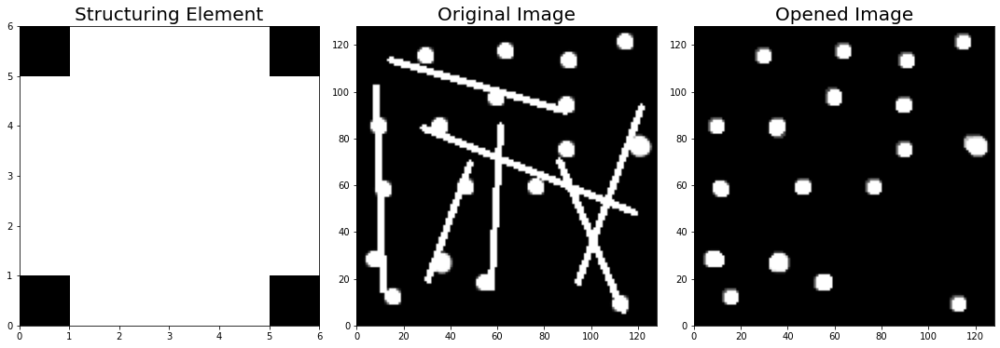

In [24]:
# Apply opening on the original image with dot structuring element
apply_opening(original_image, selem_dot)

Opening applied on original image with dot structuring element. (Left) Photo by Author. | (Middle) Photo by Borja, B. | (Right) Photo by Author.

---
<h3 style="color:#9e02bb">B4. Closing</h3>


Closing, the opposite of opening, is a morphological operation that involves `dilation followed by erosion`. The operation is performed using the same structuring element for both the dilation and erosion operations. Closing is especially beneficial for closing small holes and gaps in larger objects without significantly altering their size or shape. By performing `dilation` first, small holes and gaps within objects are filled, and the overall connectivity is improved. Subsequently, `erosion` helps in maintaining the shape and size of larger objects, ensuring their structural integrity.

To illustrate closing, let’s use `art2.png` image and try to connect the gaps:



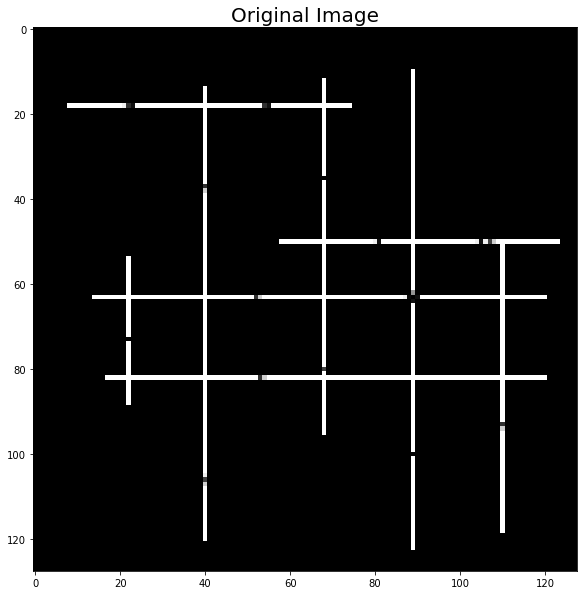

In [16]:
# Display the original image
original_image = rgb2gray(imread('art2.png'))
plt.figure(figsize=(10,10))
plt.imshow(original_image, cmap='gray')
plt.title('Original Image', fontsize=20);

Original Image. Photo by Borja, B.

To connect the broken lines which are present in both horizontal and vertical lines, we have to create two structuring elements:

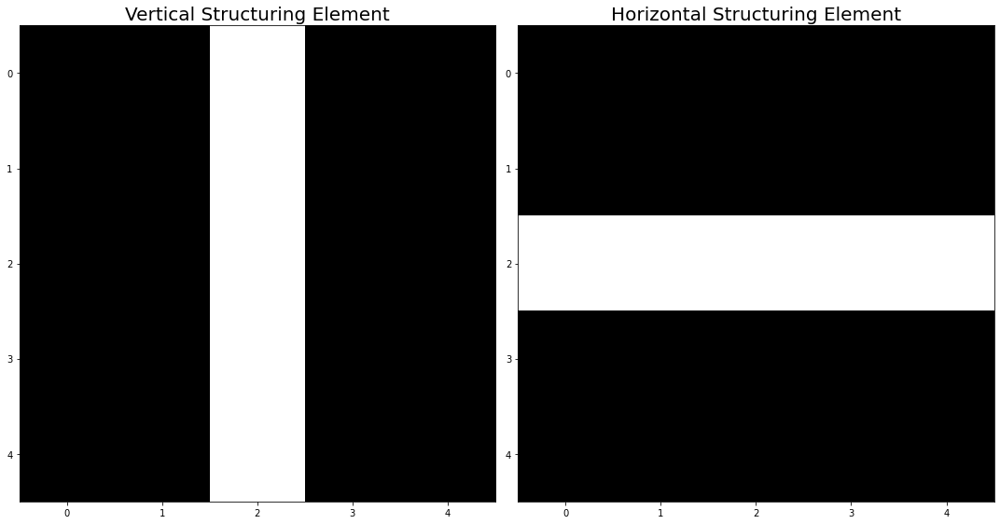

In [18]:
# Define Structuring element for vertical lines
selem_ver = np.array([[0,0,1,0,0],
                      [0,0,1,0,0],
                      [0,0,1,0,0],
                      [0,0,1,0,0],
                      [0,0,1,0,0]])

# Define Structuring element for horizontal lines
selem_hor = np.array([[0,0,0,0,0],
                      [0,0,0,0,0],
                      [1,1,1,1,1],
                      [0,0,0,0,0],
                      [0,0,0,0,0]])

# Display the structuring elements as subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
ax = axes.ravel()

ax[0].imshow(selem_ver, cmap='gray')
ax[0].set_title('Vertical Structuring Element', fontsize=20)

ax[1].imshow(selem_hor, cmap='gray')
ax[1].set_title('Horizontal Structuring Element', fontsize=20)

plt.tight_layout()
plt.show()


Vertical and Horizontal Structuring Elements. Photo by Author.

Next, set up and use the following `apply_closing` function:

In [19]:
def apply_closing(image, selem):
    # Perform closing on the given image using the structuring element, selem
    closed_image = closing(image, selem)

    # Display the original and closed images
    fig, axes = plt.subplots(1, 3, figsize=(15, 10))
    ax = axes.ravel()
    
    ax[0].imshow(selem, cmap='gray', 
                 extent=[0, selem.shape[1], 0, selem.shape[0]])
    ax[0].set_title('Structuring Element', fontsize=20)

    ax[1].imshow(image, cmap='gray', 
                 extent=[0, image.shape[1], 0, image.shape[0]])
    ax[1].set_title('Original Image', fontsize=20)

    ax[2].imshow(closed_image, cmap='gray', 
                 extent=[0, image.shape[1], 0, image.shape[0]])
    ax[2].set_title('Closed Image', fontsize=20)

    plt.tight_layout()
    plt.show()

If we only want to fill the gap in vertical lines, apply closing using the `selem_ver`:

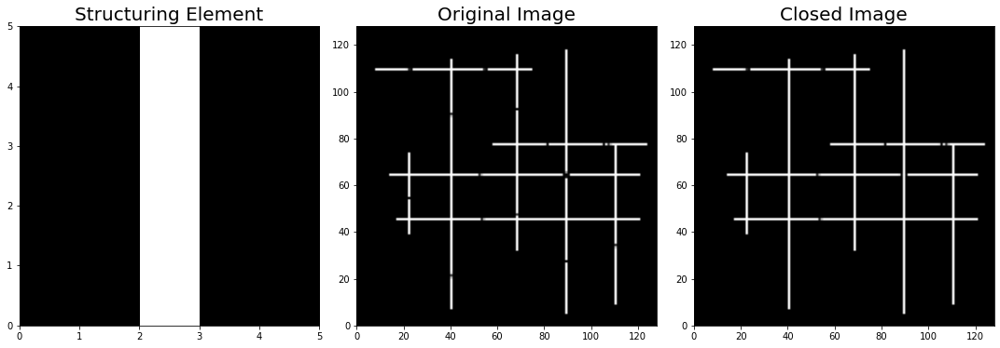

In [20]:
# Apply closing with the vertical selem
closed_image = apply_closing(original_image, selem_ver)

Closing applied on original image with vertical structuring element. (Left) Photo by Author. | (Middle) Photo by Borja, B. | (Right) Photo by Author.

Likewise, to fill the gap in horizontal lines, use `selem_hor`:

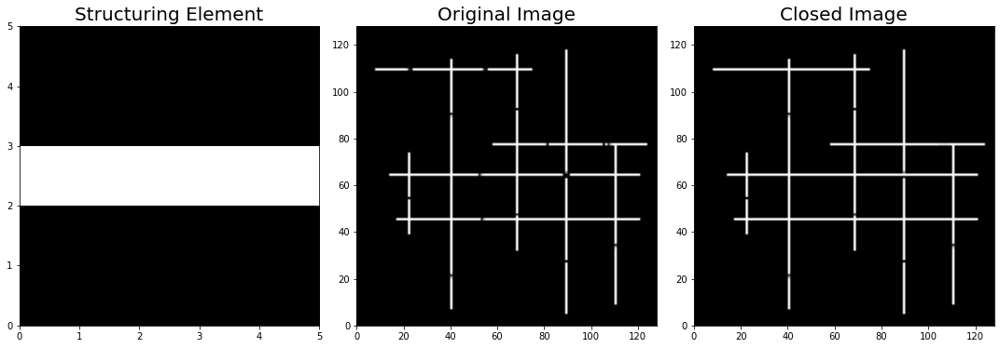

In [30]:
# Apply closing with the horizontal selem
closed_image = apply_closing(original_image, selem_hor)

Closing applied on original image with horizontal structuring element. (Left) Photo by Author. | (Middle) Photo by Borja, B. | (Right) Photo by Author.

To fill the gaps in both horizontal and vertical lines, we need to apply closing with one selem first (i.e., `selem_ver` first), and then use the output of that function as an input for the next run of closing that uses the next selem (i.e., `selem_hor`).

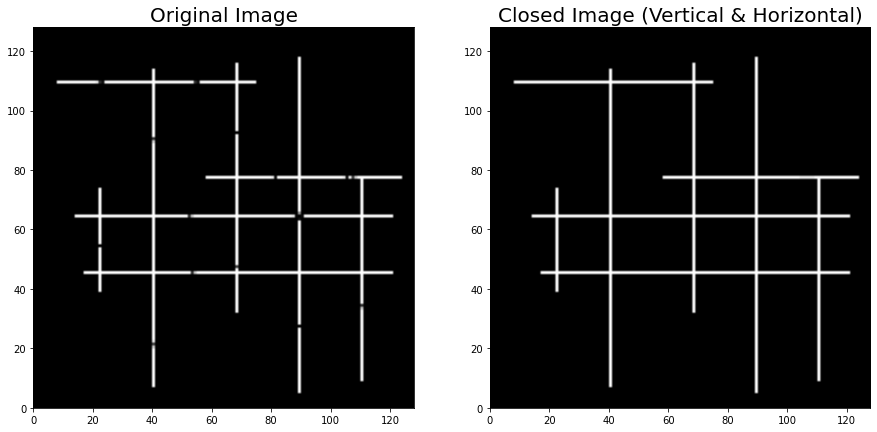

In [31]:
def apply_closing(image, selem):
    # Perform closing on the given image using the structuring element, selem
    closed_image = closing(image, selem)

    return closed_image


# Apply closing with the vertical selem
closed_image_ver = apply_closing(original_image, selem_ver)

# Apply closing with the horizontal selem
closed_image_hor = apply_closing(closed_image_ver, selem_hor)


# Display the original and closed images
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
ax = axes.ravel()

ax[0].imshow(original_image, cmap='gray', 
             extent=[0, original_image.shape[1], 0, original_image.shape[0]])
ax[0].set_title('Original Image', fontsize=20)

ax[1].imshow(closed_image_hor, cmap='gray', 
             extent=[0, closed_image_hor.shape[1], 0, closed_image_hor.shape[0]])
ax[1].set_title('Closed Image (Vertical & Horizontal)', fontsize=20);

Closing applied on original image with both vertical and horizontal structuring elements. (Left) Photo by Borja, B. | (Right) Photo by Author.


And there you have it. I have completely demonstrated the basics of spatial filters and morphological operations. Each operation has its unique advantages and uses, and combining these operations in different ways allows us to perform a wide range of image processing tasks.



---
<h2 style="color:#ff0090">Conclusion</h2>


In this episode, we embarked on an exciting journey through spatial filters and morphological operations, unleashing the true potential of image processing. Here’s a quick recap of what we’ve learned:

- Spatial filters are versatile tools for tasks like noise reduction, edge detection, and smoothing, enhancing our images in remarkable ways. 🌟
- Morphological operations allow us to shape and structure objects within an image, opening doors to noise reduction, object segmentation, and boundary extraction. 🚪🔍
- Erosion, dilation, opening, and closing are the fundamental morphological operations that we’ve explored. Each operation has its unique characteristics and applications, giving us the power to mold images to our desired forms. 💪🖼️

As we continue our adventure through the captivating world of image processing, remember that these techniques are just the beginning. There’s a vast universe of knowledge and techniques waiting to be discovered. I encourage you to dive deeper, experiment, and apply these techniques to your own projects. Stay tuned for the next episode, where we’ll uncover more awe-inspiring techniques that will take your image processing skills to new heights! 📚🚀

---
<h2 style="color:#ff0090">References</h2>


- Gonzalez, R. C., & Woods, R. E. (2018). Digital Image Processing. Pearson. van der Walt, S., Schönberger, J. L., Nunez-Iglesias, J., Boulogne, F., Warner, J. D., Yager, N., … & Yu, T. (2014). scikit-image: image processing in Python. PeerJ, 2, e453.
- Wikipedia contributors. (2023, May 7). Kernel (image processing). In Wikipedia, The Free Encyclopedia. Retrieved 15:37, May 7, 2023, from https://en.wikipedia.org/wiki/Kernel_(image_processing)
- MathWorks. (n.d.). Morphological Dilation and Erosion. In MATLAB Documentation. Retrieved from https://www.mathworks.com/help/images/morphological-dilation-and-erosion.html
- Borja, B. (2023). Lecture 3: Filtering and Morphological Operations [Jupyter Notebook]. Introduction to Image Processing 2023, Asian Institute of Management